# MRI NIH : Data loading

The input data is supposed to be sharing the same orientation, resolution and matrix size (i.e. sharing a common header for the whole dataset).

## Imports

In [3]:
import sys
sys.path.insert(0, '../')
import json
import numpy as np
import torch
from torch.utils.data import DataLoader
from torchvision import transforms as torch_transforms
import matplotlib.pyplot as plt
import torchvision.utils as vutils
import transforms
import dataset

/Users/frpau_local/sct_3.1.1/python/lib/python2.7/site-packages/h5py/__init__.py:34: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


## Paths

In [4]:
path_parameters = '/Users/frpau_local/Documents/nih/data/luisa_with_gt/parameters.json'
path_filenames = "/Users/frpau_local/Documents/nih/data/luisa_with_gt/filenames_training.txt"

## Hyperparameters

In [5]:
parameters = json.load(open(path_parameters))
print json.dumps(parameters, indent=4, sort_keys=True)

{
    "input": {
        "data_type": "float32", 
        "matrix_size": [
            160, 
            160
        ], 
        "orientation": "RAI", 
        "resolution": "0.15x0.15"
    }, 
    "net": {
        "bn_momentum": 0.1, 
        "drop_rate": 0.3
    }, 
    "training": {
        "batch_size": 10, 
        "learning_rate": 1e-06, 
        "loss_function": "dice", 
        "lr_schedule": "poly", 
        "nb_epochs": 10, 
        "optimizer": "adam", 
        "poly_schedule_p": 0.9, 
        "square_dice": true, 
        "write_param_histograms": false
    }, 
    "transforms": {
        "alpha_range": [
            10, 
            15
        ], 
        "channel_shift_range": 20, 
        "elastic_rate": 0.3, 
        "flip_rate": 0.5, 
        "max_angle": 20, 
        "ratio_range": [
            0.75, 
            1.25
        ], 
        "scale_range": [
            0.5, 
            1
        ], 
        "sigma_range": [
            3.5, 
            4
        ]
   

## Transforms

In [6]:
randomVFlip = transforms.RandomVerticalFlip()
randomResizedCrop = transforms.RandomResizedCrop(parameters["input"]["matrix_size"], scale=parameters["transforms"]["scale_range"], ratio=parameters["transforms"]["ratio_range"], dtype=parameters['input']['data_type'])
randomRotation = transforms.RandomRotation(parameters["transforms"]["max_angle"])
elasticTransform = transforms.ElasticTransform(alpha_range=parameters["transforms"]["alpha_range"], sigma_range=parameters["transforms"]["sigma_range"], p=parameters["transforms"]["elastic_rate"], dtype=parameters['input']['data_type'])
channelShift = transforms.ChannelShift(parameters["transforms"]["channel_shift_range"], dtype=parameters['input']['data_type'])

composed = torch_transforms.Compose([randomVFlip,randomRotation, randomResizedCrop, elasticTransform, channelShift])

## Dataset

In [7]:
dataset_without_transform = dataset.MRI2DSegDataset(path_filenames, parameters["input"]["matrix_size"], parameters["input"]["orientation"], parameters["input"]["resolution"])
dataset_with_transform  = dataset.MRI2DSegDataset(path_filenames, parameters["input"]["matrix_size"], parameters["input"]["orientation"], parameters["input"]["resolution"], transform = composed)

In [8]:
dataloader_without_transform = DataLoader(dataset_without_transform, batch_size=4, shuffle=True)
dataloader_with_transform = DataLoader(dataset_with_transform, batch_size=4, shuffle=True)

## Visualize data

In [9]:
def visualize_batch(sample_batched):
    for j in range(len(sample_batched['input'])):
        n = max(sample_batched['input'].size()[1],sample_batched['gt'].size()[1])
        plt.figure(figsize=(40,20))
        for i in range(sample_batched['input'].size()[1]):
            input_image = vutils.make_grid((torch.tensor(sample_batched['input'][j,i,:,:], dtype=torch.float32)), normalize=True, scale_each=True)
            input_image = input_image.numpy()
            input_image = np.moveaxis(input_image, 0, 2)
            plt.subplot(2,n,1+i)
            plt.imshow(input_image)
        for i in range(sample_batched['gt'].size()[1]):
            plt.subplot(2,n,n+i+1)
            gt_image = vutils.make_grid(sample_batched['gt'][j,i,:,:], normalize=True, scale_each=True)
            gt_image = gt_image.numpy()
            gt_image = np.moveaxis(gt_image, 0, 2)
            plt.imshow(gt_image)
        plt.show()

### without transforms

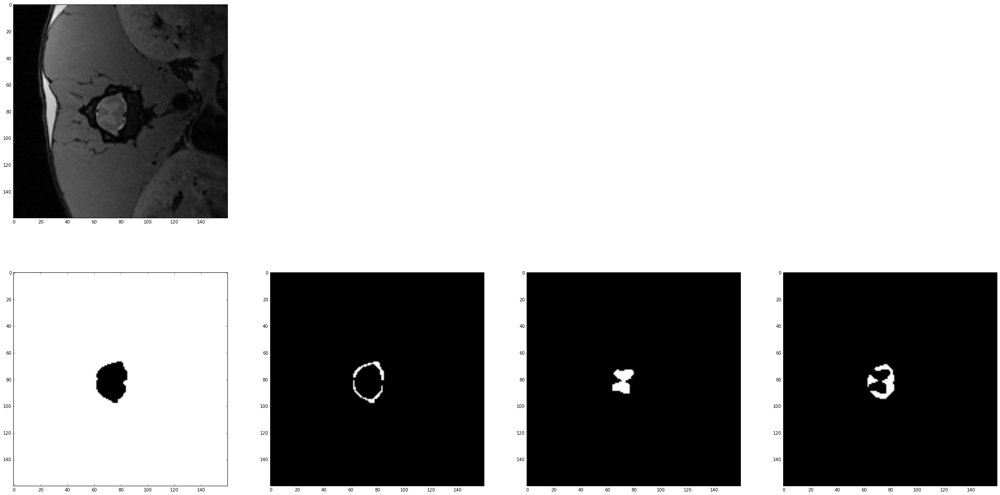

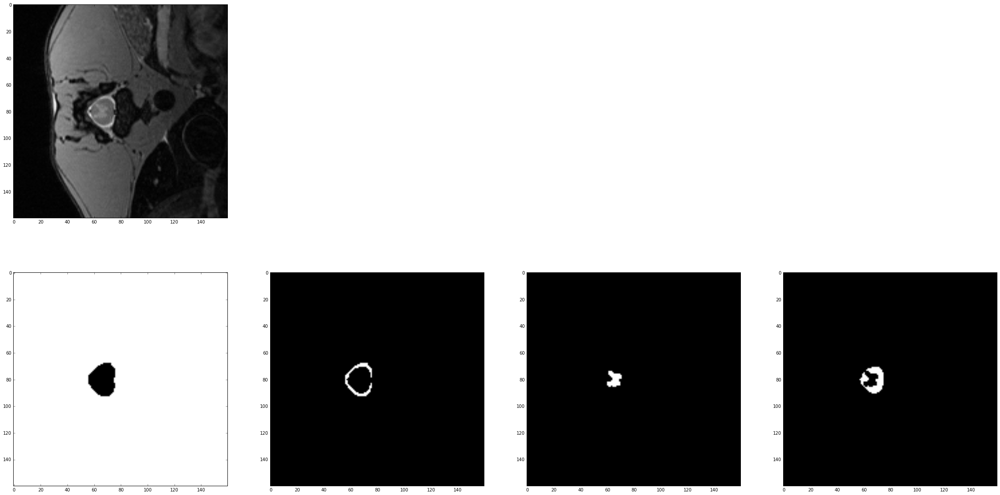

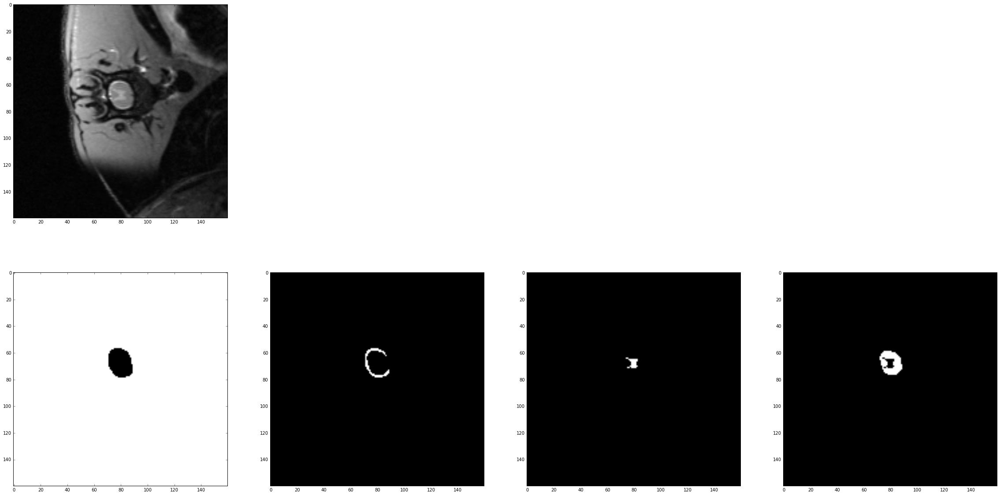

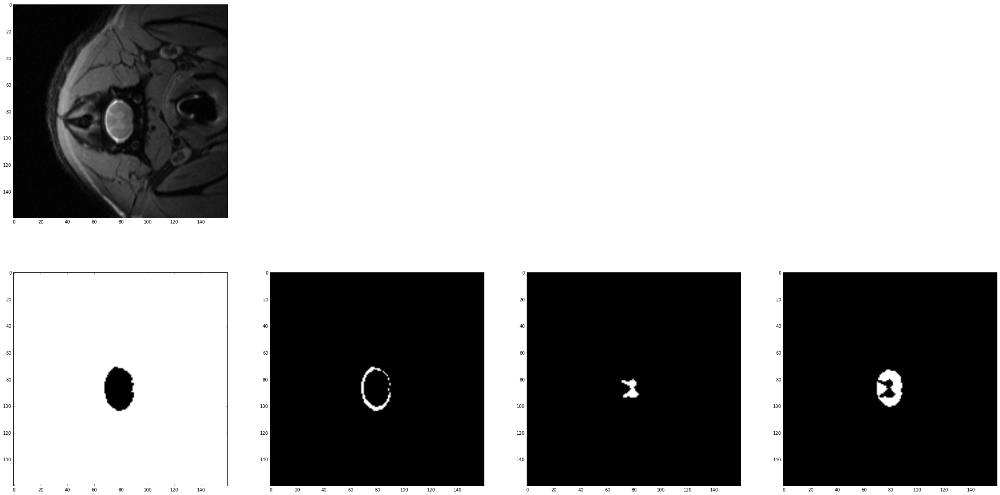

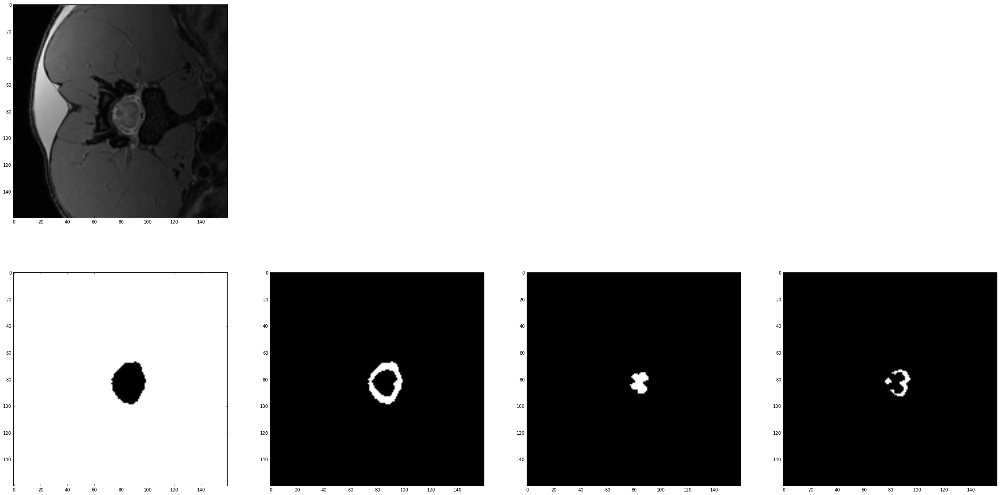

...

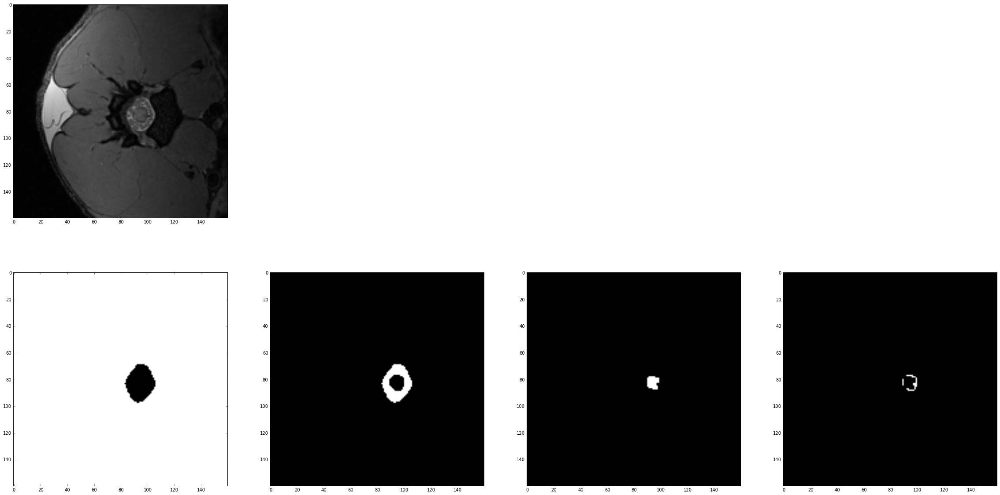

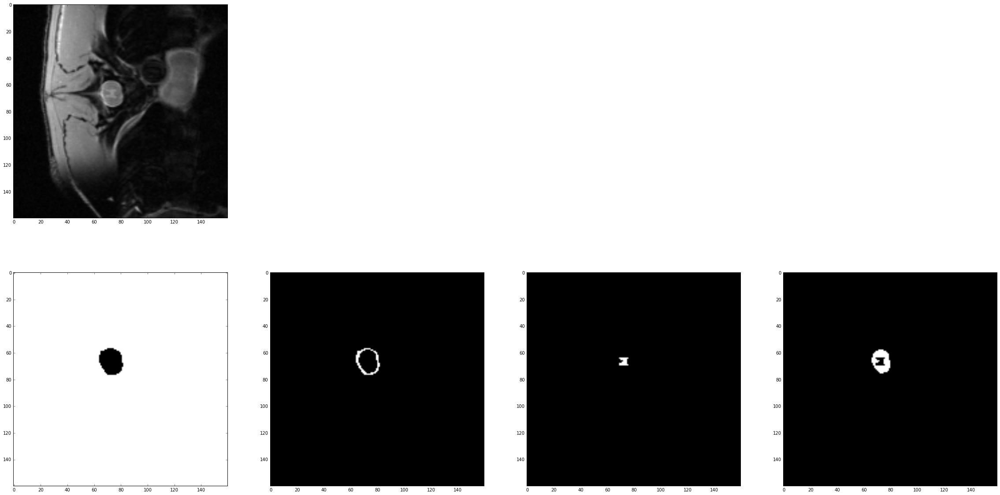

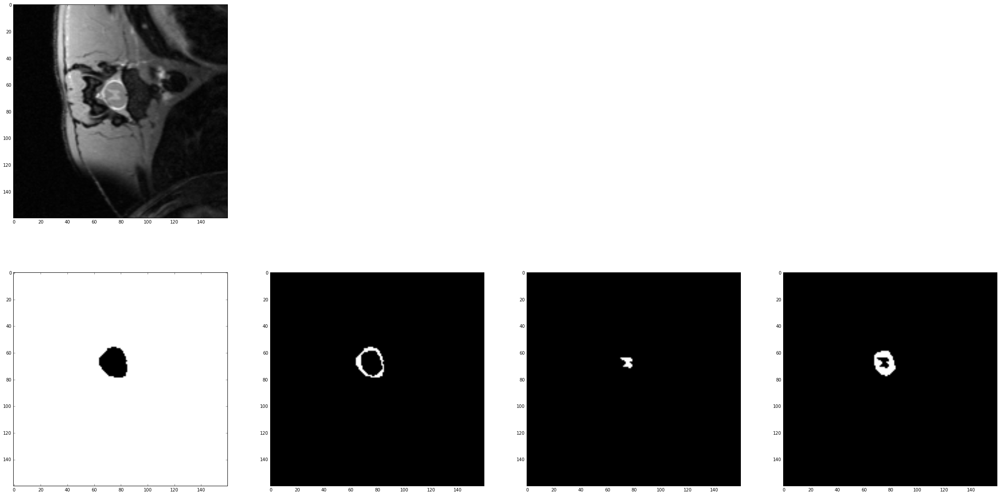

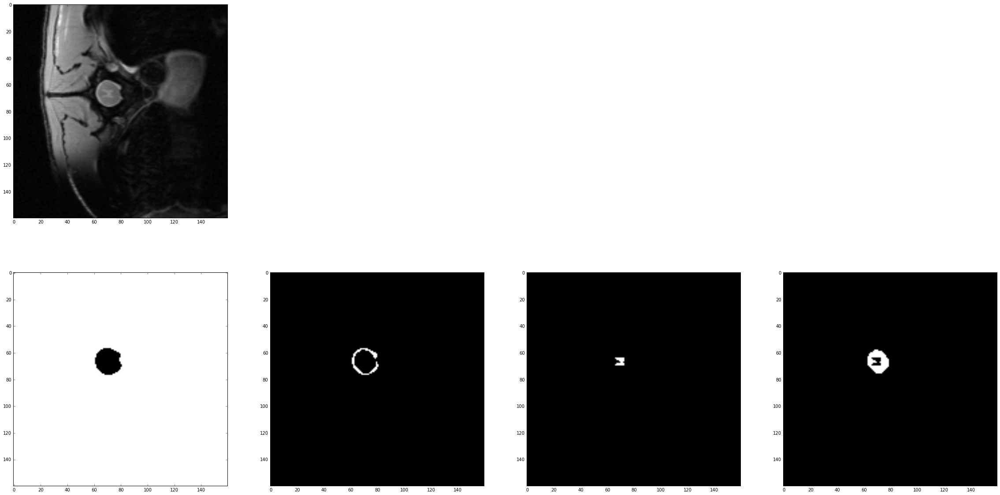

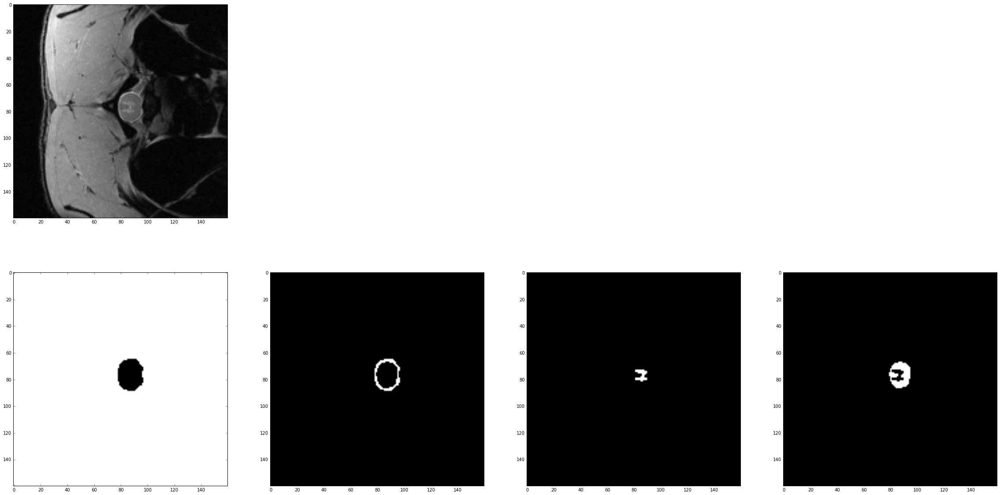

In [11]:
for i_batch, sample_batched in enumerate(dataloader_without_transform):
    #if not i_batch:
        visualize_batch(sample_batched)

### with transforms

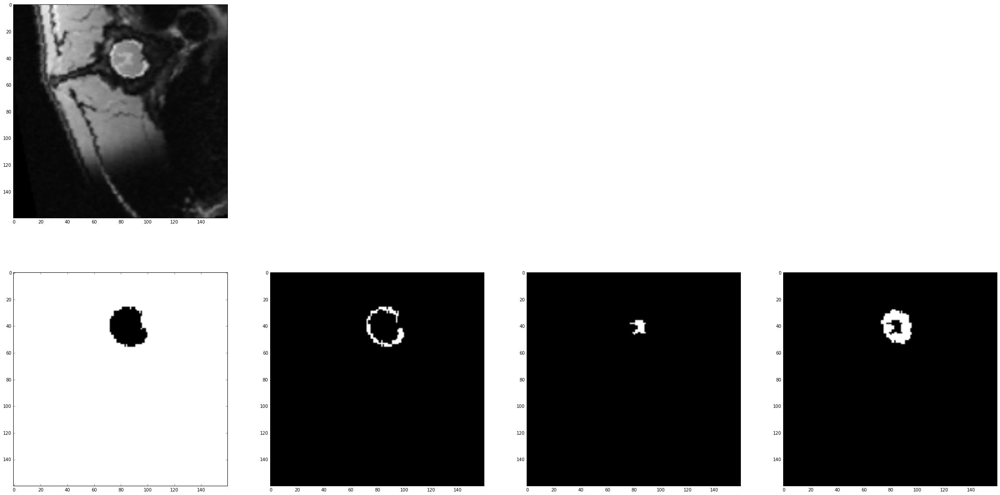

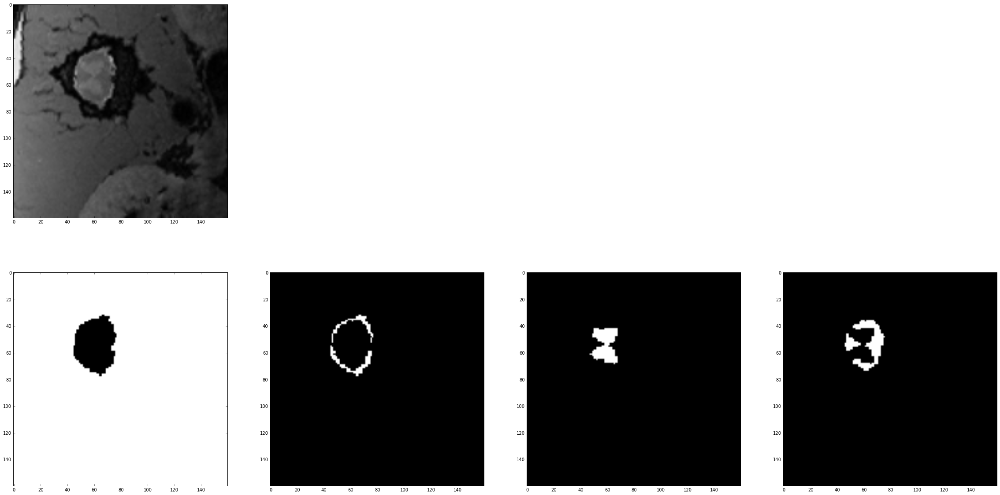

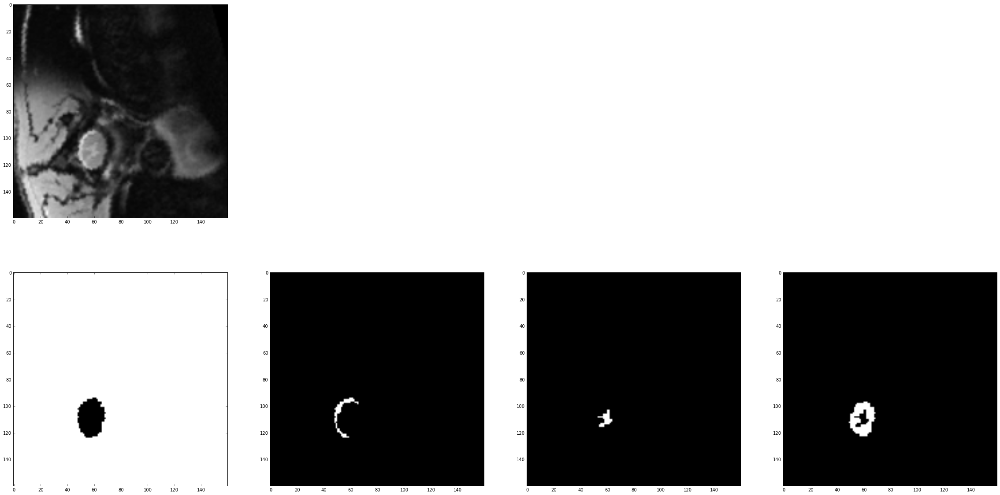

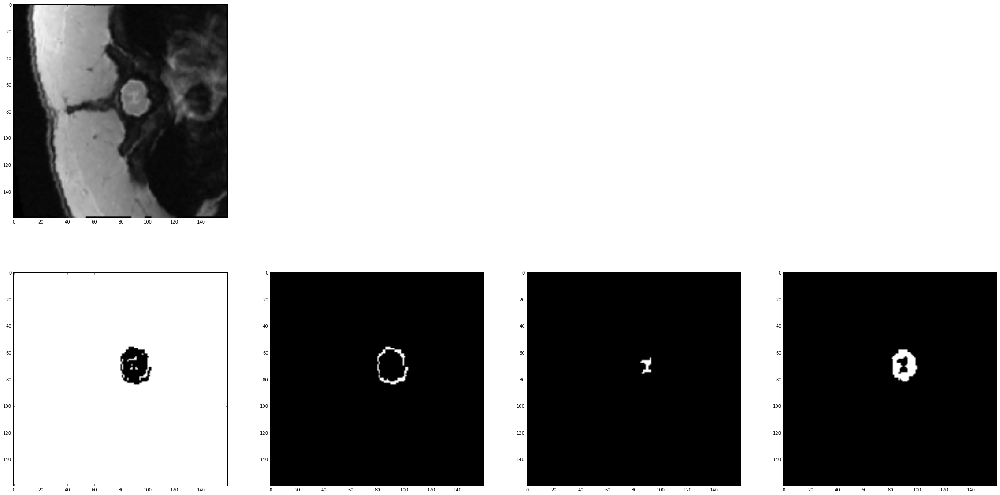

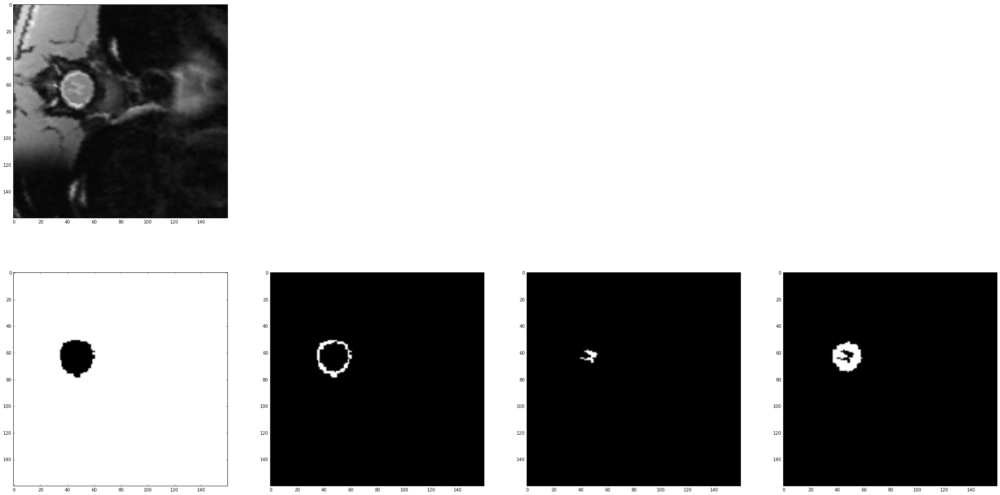

...

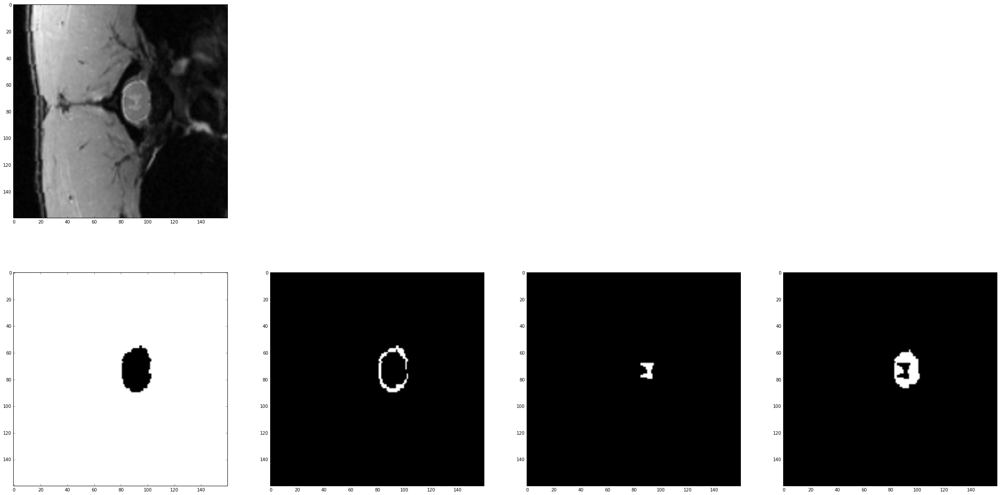

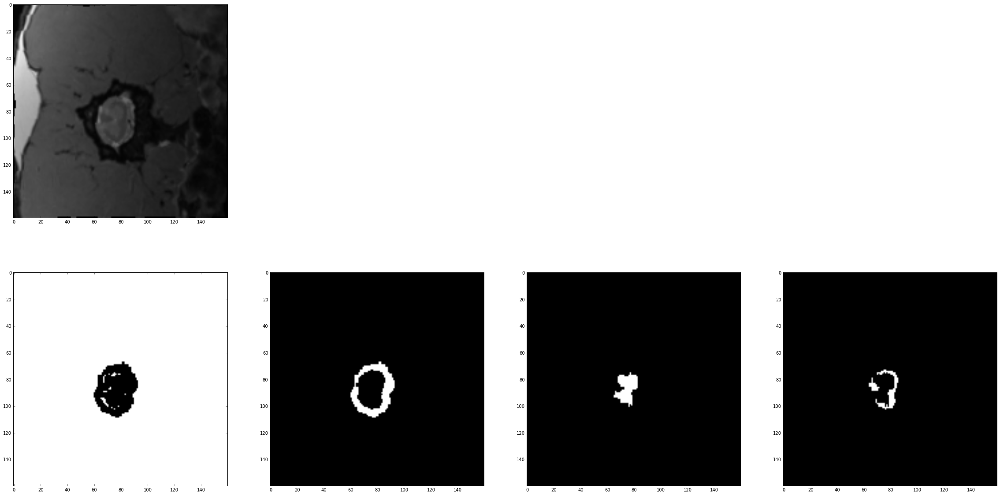

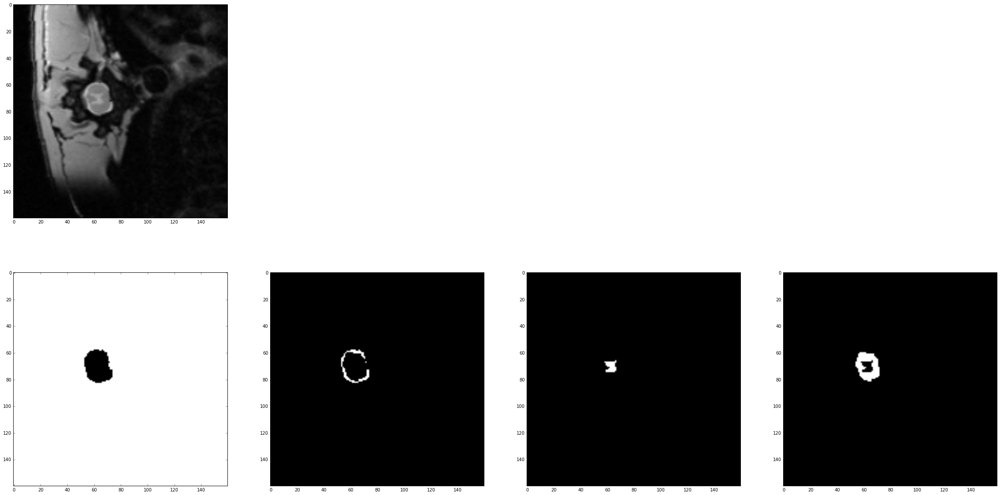

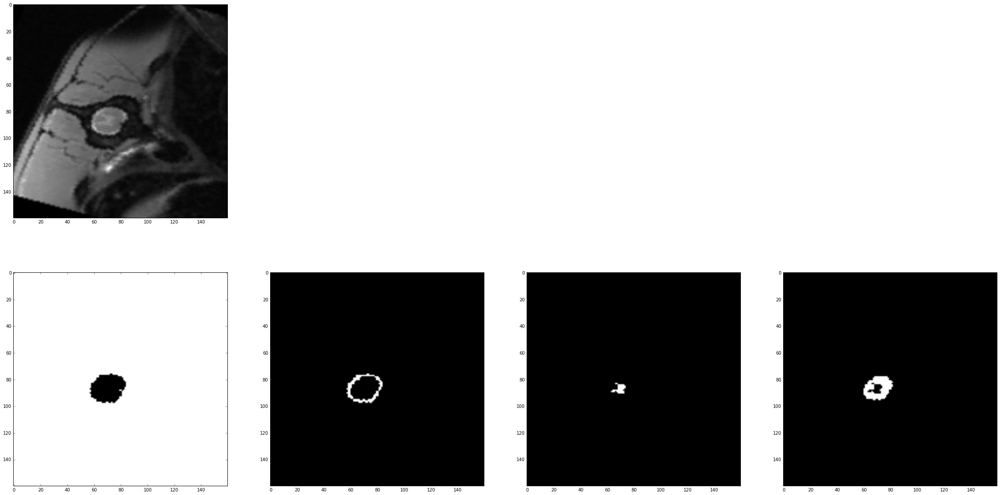

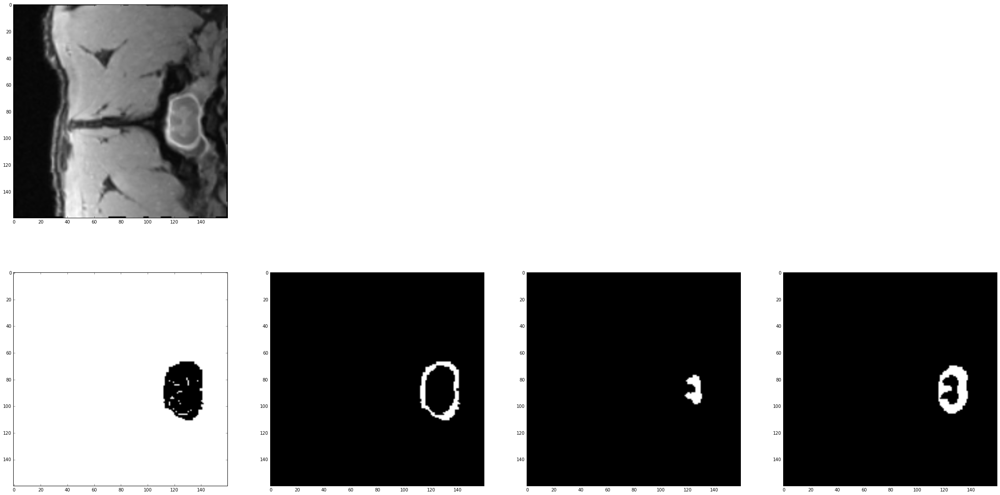

In [287]:
for i_batch, sample_batched in enumerate(dataloader_with_transform):
    #if not i_batch:
        visualize_batch(sample_batched)